# 😎 Chapter 3. Part 2: Multiple Linear Regression

In this section, we will perform Multiple Linear Regression using the same data and configuration as in the previous section. Additionally, unlike the previous section, we will include the argument `print(model.summary())` to display a more detailed analysis. Let's dive in! 🤽

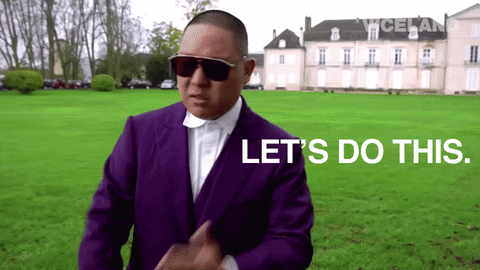

## Part 1: 📈 Simple Linear Regression
Now that we have the packages loaded, let's get our hands dirty. We shall start with Simple Linear Regression using the famous Boston data as outlined in the textbook.

#### 📚 Theory Summary

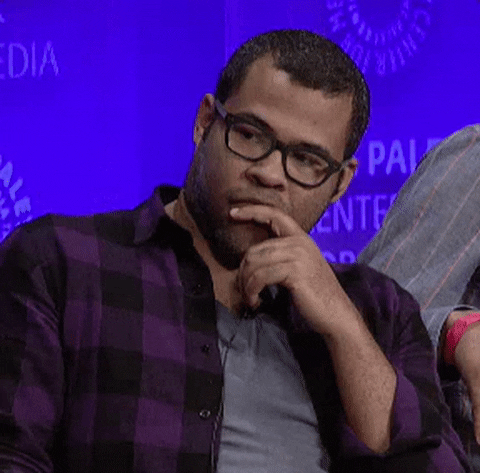

In summary, the `Multiple Linear Regression` is defined as

$$Y = \beta_0 + \beta_1 X_1 + \beta_2 X_2 + \beta_3 X_3 + \ldots + \beta_p X_p + \epsilon$$


#### 📊 Coefficients Estimating

To estimate $Y$ on the basis of $X_i = x_i$, we need to model

$$
\hat{y} = \hat{\beta}_0 + \hat{\beta}_1 x_1 + \hat{\beta}_2 x_2 + \dots + \hat{\beta}_p x_p
$$

and the residual sum of square $RSS$ is defined by

$$
RSS = \displaystyle \sum_{i=1}^{n}{(y_i - \hat{y}_i)^2}
$$


### 📦 Load Packages

In [1]:
import numpy as np
import pandas as pd
from matplotlib.pyplot import subplots
import statsmodels.api as sm
from statsmodels.stats.outliers_influence \
import variance_inflation_factor as VIF
from statsmodels.stats.anova import anova_lm
from ISLP import load_data
from ISLP.models import (ModelSpec as MS, summarize, poly)

import warnings
warnings.filterwarnings("ignore")


### 🔢 Load Data

In [2]:
Boston = load_data('Boston')

Now, we will execute the regression. For Multiple Linear Regression, we will utilize the `ModelSpec()` function, which is necessary to construct the model matrix response. We will fit the variables `lstat` and `age`.

In [3]:
y = Boston['medv']
X1 = MS(['lstat', 'age']).fit_transform(Boston)
model1 = sm.OLS(y, X1).fit()
print(model1.summary())

                            OLS Regression Results                            
Dep. Variable:                   medv   R-squared:                       0.551
Model:                            OLS   Adj. R-squared:                  0.549
Method:                 Least Squares   F-statistic:                     309.0
Date:                Sun, 17 Mar 2024   Prob (F-statistic):           2.98e-88
Time:                        11:28:47   Log-Likelihood:                -1637.5
No. Observations:                 506   AIC:                             3281.
Df Residuals:                     503   BIC:                             3294.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     33.2228      0.731     45.458      0.0

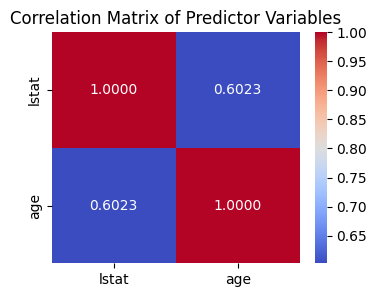

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
correlation_matrix = X1.iloc[:, 1:].corr()

# Plot the heatmap
plt.figure(figsize=(4, 3))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".4f")
plt.title('Correlation Matrix of Predictor Variables')
plt.show()

#### 🔍 Interpretation of the Coefficients

The regression analysis reveals several significant findings. Firstly, the intercept term is estimated at 33.2228, indicating that when all other predictors are held constant, the average value of the response variable stands at 33.2228 when both `lstat` and `age` are zero. Both `lstat` and `age` exhibit statistically significant relationships with the response variable. Specifically, for every one unit increase in `lstat`, the response variable decreases by 1.0321 units, while for each one unit increase in `age`, the response variable increases by 0.0345 units. These relationships are supported by low p-values (P < 0.05), signifying their statistical significance.

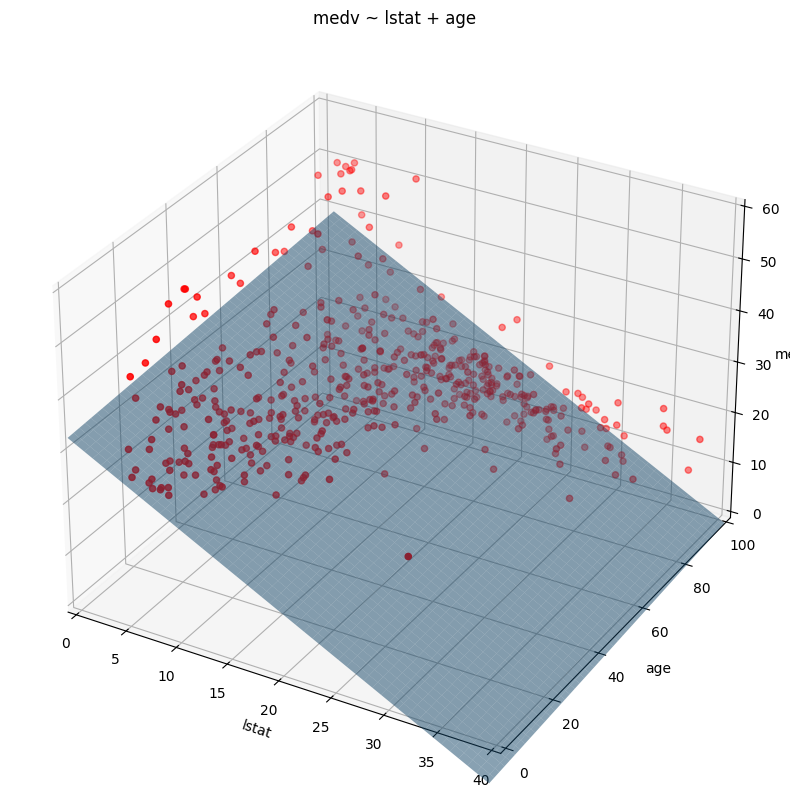

In [5]:
# plot a 3d plane of the model1 with sum of squares
fig, ax = plt.subplots(figsize=(10,10), subplot_kw={'projection': '3d'})
ax.scatter(Boston['lstat'], Boston['age'], y, color='r')
ax.set_xlabel('lstat')
ax.set_ylabel('age')
ax.set_zlabel('medv')
x = np.linspace(*ax.get_xlim()[:2], 100)
y = np.linspace(*ax.get_ylim()[:2], 100)
x, y = np.meshgrid(x, y)
z = model1.params[0] + model1.params[1]*x + model1.params[2]*y
ax.plot_surface(x, y, z, alpha=0.5)
ax.set_title('medv ~ lstat + age')
ax.set_zlim(0, 60)
ax.set_xlim(0, 40)
ax.set_ylim(0, 100)
fig.show()

#### 🔍 Analysis of all variables

In this section, we will analyze the entire dataframe in relation to the response variable `medv`. To prevent redundancy in the model matrix, we will exclude `medv` from the predictor variables. Additionally, we will set the confidence interval to 90% for this analysis (`aplha=0.1`).

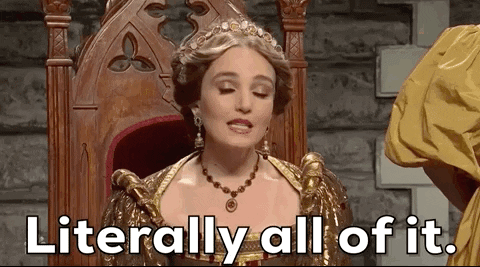

In [6]:
# drop 'medv'
terms = Boston.columns.drop('medv')

# fit all terms
X2 = MS(terms).fit_transform(Boston)
y = Boston['medv']  # Add this line to define the response variable
modelAll = sm.OLS(y, X2).fit()
print(modelAll.summary(alpha=0.1)) # set 90% confidence interval

                            OLS Regression Results                            
Dep. Variable:                   medv   R-squared:                       0.734
Model:                            OLS   Adj. R-squared:                  0.728
Method:                 Least Squares   F-statistic:                     113.5
Date:                Sun, 17 Mar 2024   Prob (F-statistic):          2.23e-133
Time:                        11:28:48   Log-Likelihood:                -1504.9
No. Observations:                 506   AIC:                             3036.
Df Residuals:                     493   BIC:                             3091.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|       [0.05       0.95]
------------------------------------------------------------------------------
intercept     41.6173      4.936      8.431      0.0

#### 🔍 Interpretation of the Coefficients

The intercept coefficient is 41.6173, suggesting that when all predictor variables are zero, the median value of the house is estimated to be approximately \$41,617.3. The p-value associated with this coefficient is very small (P < 0.05), indicating its statistical significance. Among the predictor variables, `crim`, `zn`, `chas`, `nox`, `rm`, `dis`, `rad`, `tax`, `ptratio`, and `lstat` exhibit statistically significant coefficients, as their p-values are less than 0.05. Notably, `crim` has a negative coefficient of -0.1214, suggesting that an increase in the per capita crime rate by one unit is associated with a decrease in the median house value by approximately \$121.4. Conversely, `zn`, `chas`, `nox`, `rm`, `dis`, `rad`, `tax`, `ptratio`, and `lstat` have positive coefficients, implying that an increase in these variables is associated with an increase in the median house value.

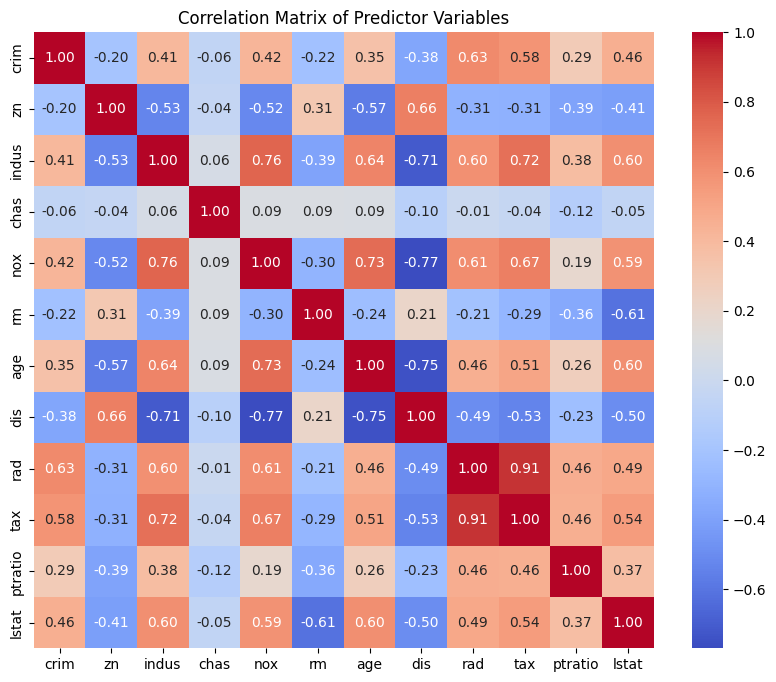

In [7]:
# Calculate the correlation matrix
correlation_matrix = X2.iloc[:, 1:].corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Predictor Variables')
plt.show()

# On to the next one ➜

Next, we will delve into `Multivariate Goodness of Fit`.

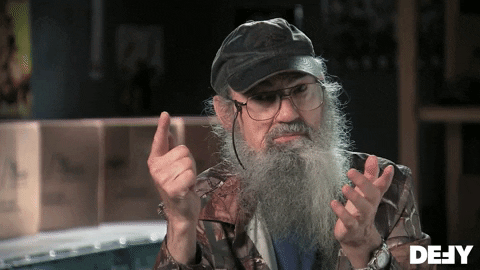